# Load Functions

## 0. imports

In [1]:
from reportlab.lib.styles import ParagraphStyle, getSampleStyleSheet
from reportlab.lib.pagesizes import A4
from reportlab.lib import colors
from reportlab.platypus import SimpleDocTemplate, Paragraph, Spacer, Table, TableStyle, Image
from reportlab.lib.utils import ImageReader
import os
import mne
import json

from utils import *
from eeg_qc import compute_eeg_pipeline, test_eeg_pipeline
from ecg_qc import ecg_qc 
from eda_qc import eda_qc
from rsp_qc import *
from mic_qc import *
from lsl_problem import *
from et_qc import *
from webcam_qc import *
import matplotlib

In [2]:
subject = "P5874642"
xdf_filename = f'/Users/bryan.gonzalez/CUNY_subs/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'

#subject = "P5548165"
#xdf_filename = f'/Users/camilla.strauss/Desktop/CUNY_Data/Data/sub-{subject}/sub-{subject}_ses-S001_task-CUNY_run-001_mobi.xdf'

#xdf_filename = #Apurva's xdf file

video_filename = '/'.join(xdf_filename.split('/')[:-1])+ f'/sub-{subject}_task-CUNY_run-001_video.avi'


In [3]:
stim_df = import_stim_data(xdf_filename)

trigger recovery


100%|██████████| 13915/13915 [00:00<00:00, 147777.25it/s]


      value   length   start_time     end_time
0     False   886410     0.000000    20.100314
396   False   485100   178.902993   189.903155
414   False  1159830   197.903311   224.203728
416   False   141120   224.303753   227.503784
420   False   507150   229.703843   241.204013
454   False   304290   251.004199   257.904292
458   False   158760   260.104352   263.704389
460   False  1221570   264.104419   291.804859
468   False  2209410   296.204956   346.305771
472   False   551250   346.805802   359.305989
824   False  3439800   521.008717   599.009999
1134  False   264600   736.012314   742.012392
1144  False   211680   746.712493   751.512551
1146  False  2050650   751.612575   798.113330
1154  False   136710   799.713380   802.813409
1156  False   167580   803.013435   806.813476
1182  False   436590   817.613679   827.513822
1442  False  1830150   924.815473   966.316144
1456  False   507150   968.916211   980.416380
1696  False  1318590  1103.918469  1133.818947
1698  False  

In [4]:
error_log = []

# Get Metrics

## 1. EEG

In [5]:
#Compute the eeg vars
eeg_vars, eeg_df, eeg_error = compute_eeg_pipeline(xdf_filename, 
                                                          stim_df=stim_df, 
                                                          task='RestingState')


Opening raw data file /Users/bryan.gonzalez/CUNY_subs/sub-P5874642/sub-P5874642_ses-S001_task-CUNY_run-001_eeg_clean.fif...
    Range : 0 ... 299987 =      0.000 ...   299.997 secs
Ready.
Reading 0 ... 299987  =      0.000 ...   299.997 secs...
Bad channels before robust reference: ['E31', 'E106', 'Cz', 'E112', 'E85', 'E48', 'E7']
Interpolated channels: ['E48', 'Cz', 'E126']
Bad channels after interpolation: []


In [6]:
if eeg_error:
    eeg_print = f"No EEG data was found for participant {subject} in {xdf_filename}."
    error_log.append(eeg_print)
else:
    eeg_print = {
        'Bad channels before robust reference': eeg_vars['bad_channels_before'], 
        'Interpolated channels': eeg_vars['interpolated_channels'], 
        'Bad channels after interpolation': eeg_vars['bad_channels_after'], 
        'Percent Good before artifact removal': f"{eeg_vars['percent_good']:.4}%",
        'Artifactual Components Excluded': f"{eeg_vars['excluded_components']}"
    }

## 2. ECG

Effective sampling rate: 499.9753719947496
Average heart rate: 88.91501527771513
Kurtosis signal quality index: 18.263974837270094
Power spectrum distribution signal quality index: 0.7218979466156072
Relative power in baseline signal quality index: 35.37443716761272
Signal to Noise Ratio: 8.218690236369866


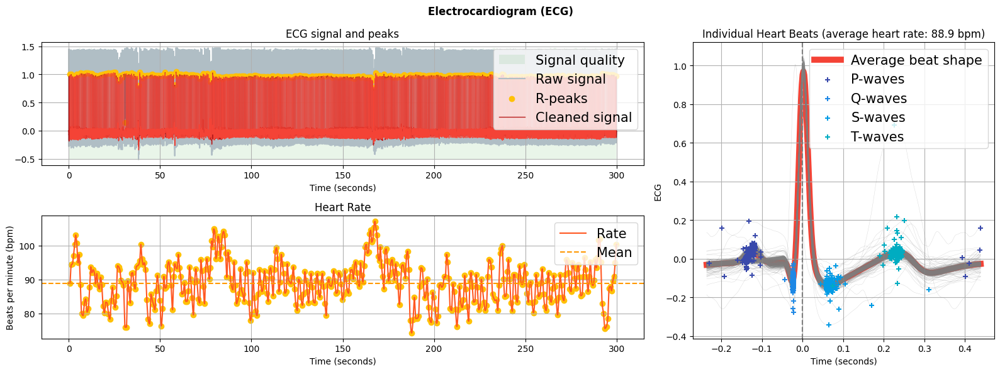

In [7]:
[ecg_vars, ecg_plt, ps_df, ecg_error] = ecg_qc(xdf_filename = xdf_filename, stim_df = stim_df, task='RestingState')

In [8]:
if ecg_error:
    ecg_print = f"No ECG data was found for participant {subject} in {xdf_filename}."
    error_log.append(ecg_print)
else:
    ecg_print = {
    "Effective sampling rate": f'{ecg_vars["sampling_rate"]:.4f} Hz', 
    "Signal to Noise Ratio": f'{ecg_vars["SNR"]:.4f} dB',
    "Average heart rate": f'{ecg_vars["average_heart_rate"]:.4f} bpm',
    "Kurtosis signal quality index (kSQI)": f'{ecg_vars["kurtosis_SQI"]:.4f}',
    "Power spectrum distribution (pSQI)": f'{ecg_vars["power_spectrum_distribution_SQI"]:.4f} mV²/Hz',
    "Relative power in baseline (basSQI)": f'{ecg_vars["relative_baseline_power_sqi"]:.4f}%'
}

## 3. EDA

Effective sampling rate: 499.975 Hz
Signal Integrity Check: 100.000 %
Average Skin Conductance Level: 1.964 mS
Skin Conductance Level Standard deviation: 1.034 mS
Skin Conductance Level Coefficient of Variation: 52.673 %
Average Amplitude of Skin Conductance Response: 0.106 mS
Skin Conductance Response Validity: 92.308 %
Signal to Noise Ratio: 54.704 dB


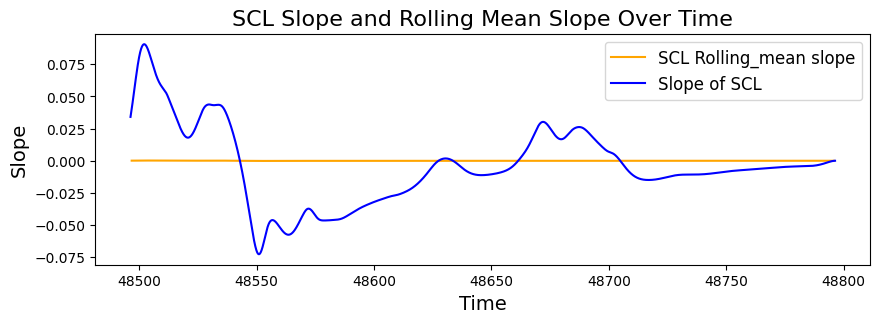

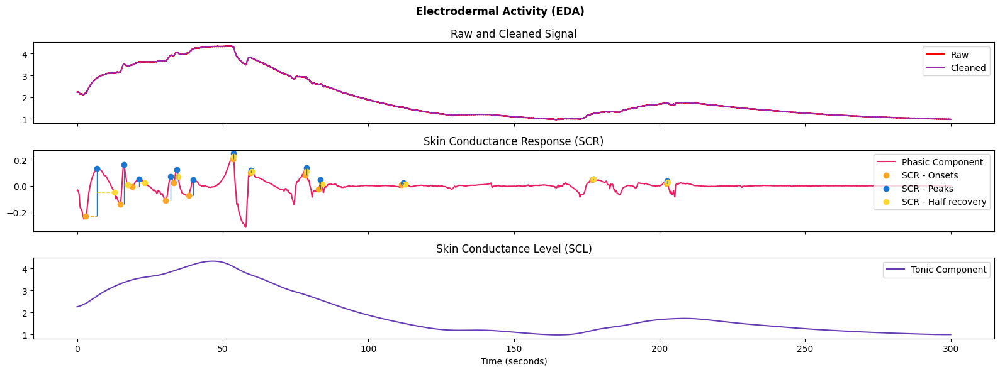

In [9]:
[eda_vars, eda_plt1, eda_plt2, ps_df, eda_error] = eda_qc(xdf_filename = xdf_filename, stim_df = stim_df, task= 'RestingState')

In [10]:
if eda_error:
    eda_print = f"No EDA data was found for participant {subject} in {xdf_filename}."
    error_log.append(eda_print)
else:
    eda_print = {
        "Effective sampling rate": f'{eda_vars["sampling_rate"]:.4f} Hz', 
        "Signal to noise ratio": f'{eda_vars["snr"]:.4f} dB',
        "Signal integrity check": f'{eda_vars["signal_integrity_check"]:.4f}%',
        "Average skin conductance level": f'{eda_vars["average_scl"]:.4f} mS',
        "Skin conductance level std": f'{eda_vars["scl_sd"]:.4f} mS',
        "Skin conductance level coefficient of variation": f'{eda_vars["scl_cv"]:.4f}%',
        "Average amplitude of skin conductance response": f'{eda_vars["average_scr_amplitude"]:.4f} mS',
        "Skin conductance response validity": f'{eda_vars["scr_validity"]:.4f}%'
    }

## 4. RSP

Effective sampling rate: 499.9754
Signal to Noise Ratio: 10.8784
Breath amplitude mean: 0.1783
Breath amplitude std: 0.1978
Breath amplitude range: 0.0288 - 1.0672
Respiration rate mean: 19.3503
Respiration rate std: 2.5517
Respiration rate range: 11.1822 - 26.2250
Peak to peak interval mean: 3.1645
Peak to peak interval std: 1.3148
Peak to peak interval range: 0.5600 - 8.7424
Baseline drift: 0.0272
Autocorrelation at typical breath cycle: 0.0299


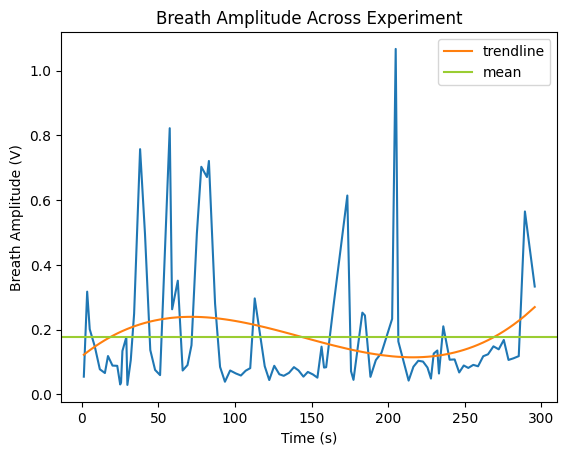

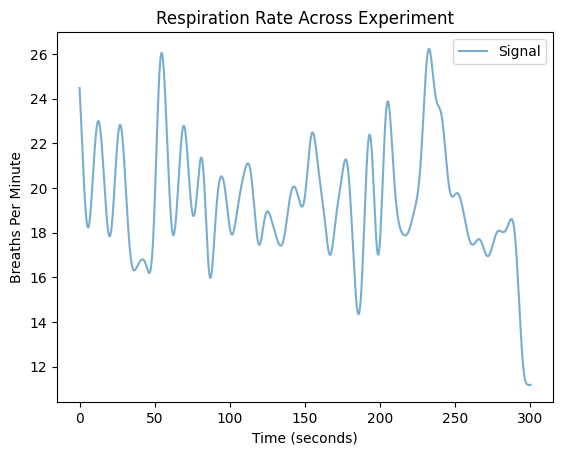

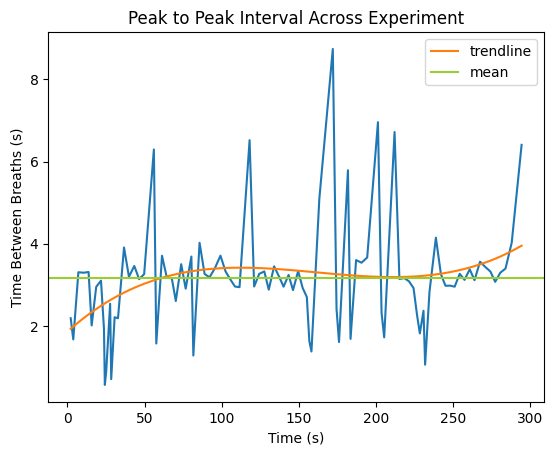

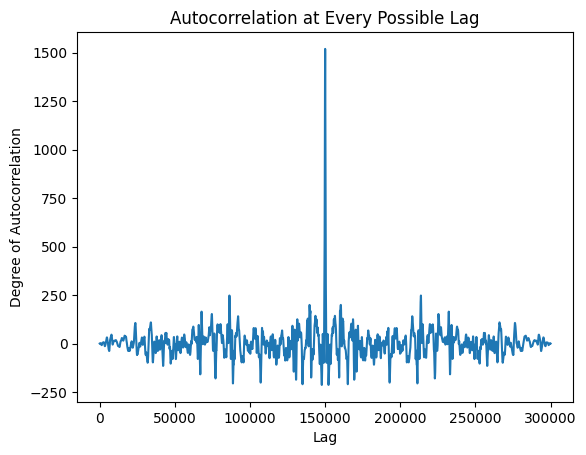

In [11]:
rsp_vars, ps_df = rsp_qc(xdf_filename=xdf_filename, stim_df=stim_df, task='RestingState')

In [12]:
rsp_print = {
    "Effective sampling rate": f'{rsp_vars["sampling_rate"]:.4f} Hz', 
    "Signal to noise ratio": f'{rsp_vars["rsp_snr"]:.4f} dB',
    "Breath amplitude mean": f'{rsp_vars["breath_amplitude_mean"]:.4f} V',
    "Breath amplitude std": f'{rsp_vars["breath_amplitude_std"]:.4f} V',
    "Breath amplitude range": f'{rsp_vars["breath_amplitude_min"]:.4f} - {rsp_vars["breath_amplitude_max"]:.4f} V',
    "Respiration rate mean": f'{rsp_vars["rsp_rate_mean"]:.4f} bpm',
    "Respiration rate std": f'{rsp_vars["rsp_rate_std"]:.4f} bpm', 
    "Respiration rate range": f'{rsp_vars["rsp_rate_min"]:.4f} - {rsp_vars["rsp_rate_max"]:.4f} bpm', 
    "Peak to peak interval mean": f'{rsp_vars["ptp_mean"]:.4f} sec', 
    "Peak to peak interval std": f'{rsp_vars["ptp_std"]:.4f} sec', 
    "Peak to peak interval range": f'{rsp_vars["ptp_min"]:.4f} - {rsp_vars["ptp_max"]:.4f} sec', 
    "Baseline drift": f'{rsp_vars["baseline_drift"]:.4f} V', 
    "Autocorrelation at typical breath cycle": f'{rsp_vars["autocorrelation"]:.4f}'
}

## 5. Mic

Effective sampling rate: 44099.2579
Difference between .wav file and lsl timestamps durations: 47.6310
number of NaN's: 0 
percent of NaN's: 0.0000%
mic samples first quartile: -34.0 
mic samples third quartile: 34.0
mic samples standard deviation: 193.4338
mic samples min: -11079 
mic samples max: 11522


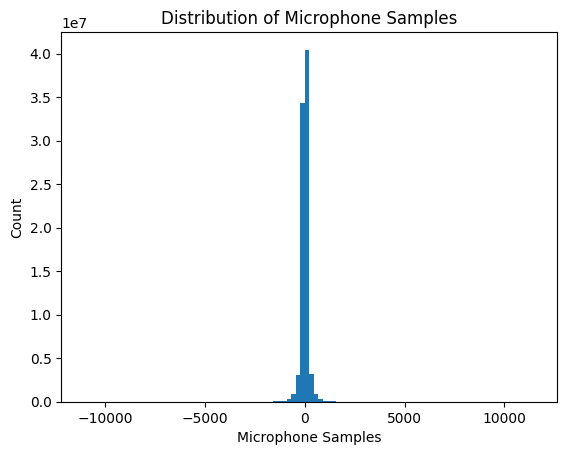

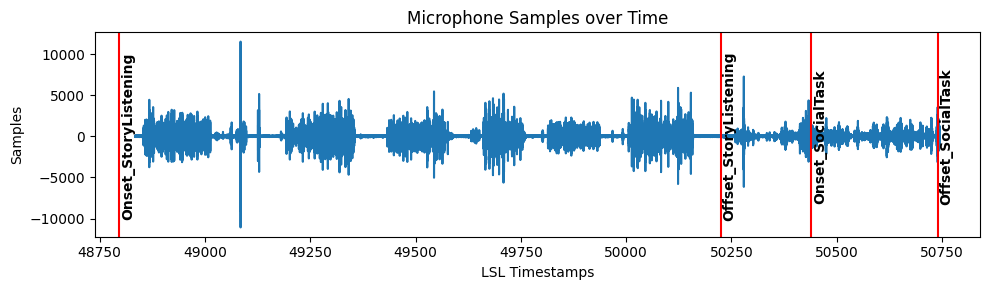

In [13]:
mic_vars, mic_df, mic_error = mic_qc(xdf_filename=xdf_filename, stim_df=stim_df)

In [14]:
if mic_error:
    mic_print = f"No mic data was found for participant {subject} in {xdf_filename}."
    error_log.append(mic_print)

else:
    mic_print = {
    "Effective sampling rate": f'{mic_vars["sampling_rate"]:.4f} Hz', 
    "Difference between .wav file and lsl timestamps durations": f'{mic_vars["lsl_wav_duration_diff"]:.4f} sec', 
    "Number of NaN's": f'{mic_vars["num_NaN"]}',
    "Percent of NaN's": f'{mic_vars["percent_NaN"]:.4f}%',
    "Mic samples first quartile": f'{mic_vars["quan25"]:.4f}',
    "Mic samples third quartile": f'{mic_vars["quan75"]:.4f}',
    "Mic samples std": f'{mic_vars["std"]:.4f}',
    "Mic samples min": f'{mic_vars["min"]:.4f}',
    "Mic samples max": f'{mic_vars["max"]:.4f}'
    }

## 6. Webcam

RestingState duration matches camera duration!
RestingState:  299.99809310638375
Webcam Stream:  299.9592192385244


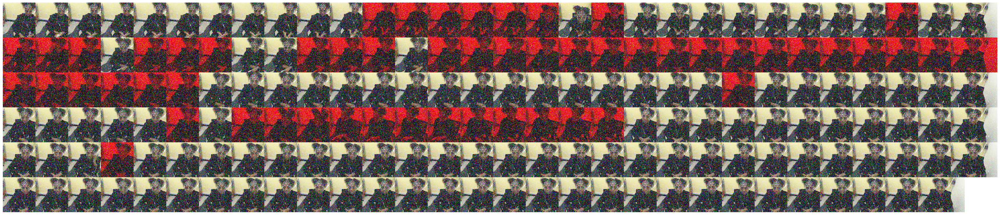

In [15]:
webcam_vars, cam_df = webcam_qc(xdf_filename=xdf_filename,
                                stim_df=stim_df,
                                video_file=video_filename, task='RestingState')

In [16]:
webcam_print = {
    "Effective sampling rate": f'{webcam_vars["sampling_rate"]:.4f} Hz', 
    "Collected full resting state": webcam_vars["collected_full_RestingState"], 
    "Percent of frames with face detected": f'{webcam_vars["face_perc"]:.4}%'
}

## 7. ET

Effective sampling rate: 119.9958
Percent invalid data in left gaze point: 22.21%
Percent invalid data in right gaze point: 24.69%
Percent invalid data in left gaze origin: 20.82%
Percent invalid data in right gaze origin: 23.65%
Percent invalid data in left pupil diameter: 22.21%
Percent invalid data in right pupil diameter: 24.69%
Flag: all coordinates have the same % validity within each measure (LR, gaze point/origin/diameter): 0.0
Flag: % of NaNs is the same between coordinate systems (UCS and TBCS (gaze origin) and between UCS and display area (gaze point)): 0.0
Mean difference in percent valid data between right and left eyes: 2.656%
Percent of data with gaze point differences of over 0.2 mm: 1.634%


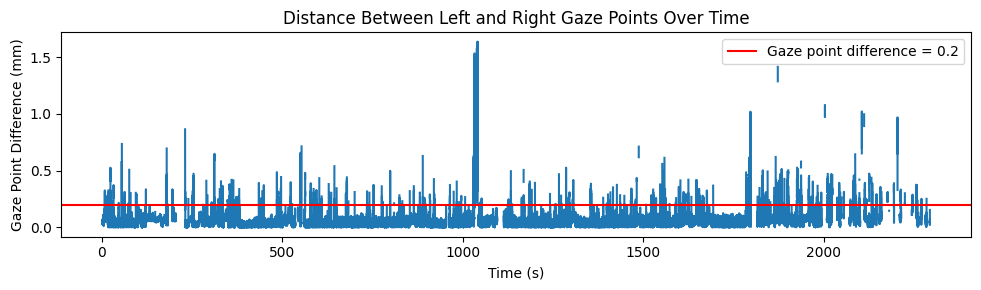

In [17]:
et_vars, et_df, et_error = et_qc(xdf_filename = xdf_filename, stim_df = stim_df, task='Experiment')

In [18]:
if et_error:
    et_print = f"No ET data was found for participant {subject} in {xdf_filename}."
    error_log.append(et_print)
else:
    et_print = {
    "Effective sampling rate": f'{et_vars["sampling_rate"]:.4f} Hz', 
    "Percent invalid data in left gaze point": f'{et_vars["left_gaze_point_invalid"]:.4}%',
    "Percent invalid data in right gaze point": f'{et_vars["right_gaze_point_invalid"]:.4}%',
    "Percent invalid data in left gaze origin": f'{et_vars["left_gaze_origin_invalid"]:.4}%',
    "Percent invalid data in right gaze origin": f'{et_vars["right_gaze_origin_invalid"]:.4}%',
    "Percent invalid data in left pupil diameter": f'{et_vars["left_pupil_invalid"]:.4}%',
    "Percent invalid data in right pupil diameter": f'{et_vars["right_pupil_invalid"]:.4}%',
    "Flag: all coordinates have the same % validity within each measure (LR, gaze point/origin/diameter)": et_vars["xyz_measures_check"], 
    "Flag: % of NaNs is the same between coordinate systems (UCS and TBCS (gaze origin) and between UCS and display area (gaze point))": et_vars["coordinate_system_check"],
    "Mean difference in percent valid data between right and left eyes": f'{et_vars["LR_mean_diff"]:.4f}%',
    "Percent of data with gaze point differences of over 0.2 mm": f'{et_vars["percent_over02"]:.4f}%'
    }

## Stream Durations 

### functions are in utils.py (but should be called in the report)

In [19]:
cam_error = False # remove this after webcam done
ps_error = False
# if ecg_error + eda_error + rsp_error == 3:
#     ps_error = True

In [20]:
df_map = {
    'et': et_df,
    'ps': ps_df,
    'mic': mic_df,
    'cam': cam_df,
    'eeg': eeg_df
    }

error_map = {
    'et': et_error,
    'ps': ps_error,
    'mic': mic_error,
    'cam': cam_error,
    'eeg': eeg_error
    }

In [21]:
duration_vars = {"Durations of each modality + comparison to expected duration:": 
    get_durations(xdf_path=xdf_filename, task='Experiment', stim_df = stim_df, df_map = df_map, error_map = error_map)}

mic is shorter than expected for Experiment by 387.5665 seconds

Experiment DataFrame


In [22]:
duration_print = duration_vars

In [29]:
duration_vars

{'Durations of each modality + comparison to expected duration:':      stream   duration    mm:ss   percent
 2       mic  1910.8685  0:31:51   83.1378
 3       cam  2296.7296  0:38:17   99.9258
 0        et  2298.1895  0:38:18   99.9893
 1        ps  2298.4332  0:38:18   99.9999
 4       eeg  2298.4337  0:38:18   99.9999
 5  expected  2298.4350  0:38:18  100.0000}

In [30]:
mic_df.to_dict()

: 

In [23]:
# i wont run these but they are here for reference
# get_durations('RestingState', xdf_filename)
# get_durations('CampFriend', xdf_filename)
# get_durations('SocialTask', xdf_filename)
# whole_durations(xdf_filename, stim_df, df_map, error_map)

## LSL Problem

    subject modality  num_losses  percent_lost
0  P5874642       et           1        0.1884
1  P5874642       ps           0        0.0000
2  P5874642      mic           0        0.0000
3  P5874642      cam           0        0.0000
4  P5874642      eeg           0        0.0000
    subject modality  num_losses  percent_lost
0  P5874642       et           0           0.0
1  P5874642       ps           0           0.0
2  P5874642      mic           0           0.0
3  P5874642      cam           0           0.0
4  P5874642      eeg           0           0.0


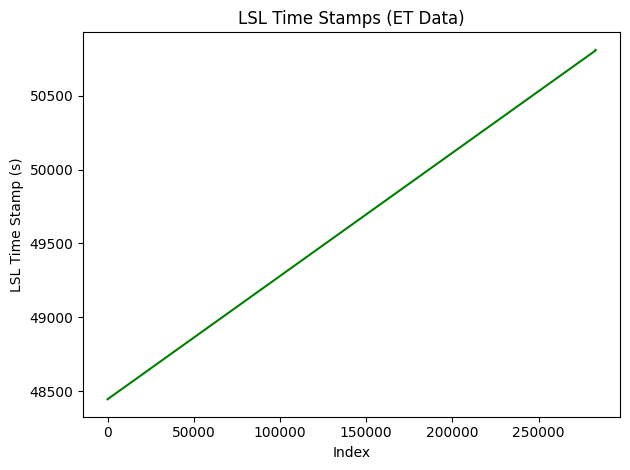

In [24]:
lsl_vars = lsl_problem_qc(xdf_filename, stim_df=stim_df, df_map=df_map, error_map = error_map, modality_to_plot='et')

In [25]:
lsl_print = {
    "Percent of missing data in entire experiment": lsl_vars["percent_loss"],
    "Percent of missing data before social task offset": lsl_vars["loss_before_social_task"]
}

# Copy

In [26]:
copy = {
    'EEG': 'Data preprocessed by performing <b>line noise removal</b>, <b>robust referencing</b>, and <b>bad channel detection/interpolation</b> using PyPrep pipeline. First, the pipeline applies a notch filter at 60 Hz and its harmonics to remove power line noise. Then, it performs <b>robust average referencing</b>, where it detects bad channels, interpolates them using surrounding signals, and computes a median-based reference across EEG channels. This ensures a stable reference even in the presence of noisy electrodes. Independent components analysis (ICA) was then performed to identify and remove ocular and muscle artifacts. The final output is a cleaned EEG dataset with a consistent reference, ready for further analysis.',
    'ET': 'In the eye tracking data, gaze origin, gaze point, and pupil diameter are reported, for the left and right eyes. Gaze origin describes the point in 3D space where the gaze vector starts, and is reported in both the user coordinate system (UCS) and the trackbox coordinate system (TBCS). Gaze point describes the spot on the screen where the participant is looking, for each eye. Gaze origin is reported in 3D space in the UCS and the display area. The percent of data for which the distance between the gaze point of the left and right eye is more than 0.2 mm is reported below.',
    'ECG': "The data was processed using the neurokit2 automated pipeline for preprocessing ECG signals. ECG data is cleaned using the default parameters that apply fifth order 0.5 Hz high-pass butterworth filter followed by 50 Hz powerline filtering. Neurokit2 was also used to calculate signal quality indices (SQI) based on Zhao et.al (2018). SQIs calculated were kurtosis (kSQI), power spectrum distribution of QRS wave (pSQI) and relative power in baseline (basSQI). kSQI was calculated using the Fisher's method. pSQI and basSQI were calculated using the Welch method.",
    'EDA': "Electrodermal Activity (EDA) is measured in microSiemens from a standard EDA sensor. EDA data quality metrics calculated from raw and clean data using neurokit2 python package. The data is processed using the neurokit2 automated pipeline for preprocessing EDA signal. EDA data is cleaned using the default parameters that apply fourth order butterworth filter. Additionally, the automated preprocessing pipeline was used to decompose the EDA signal into the tonic component, Skin Conductance Level (SCL) and the phasic component, Skin Conductance Response (SCR). The decomposition was done using default parameters that perform high-pass filtering with a cutoff frequency of 0.05Hz on EDA signal.",
    'RSP': "Respiration data is measured in volts from a piezoelectric sensor. Respiration data quality metrics are calculated both from raw and cleaned data, where the neurokit2 package was used to clean the data using the default method of a second order 0.05-3 Hz bandpass Butterworth filter, as in Khodadad et al, 2018. Neurokit2 was also used to extract the peaks and troughs of detected breaths. Respiration rate was calculated using the cross correlation method, which was more consistent to the raw data than the other trough method. Baseline drift was quantified as the standard deviation of the data after applying a lowpass filter to raw data.",
    'MIC': "For audio data, it is important to confirm that the distribution of microphone samples (see graph below) is relatively centered around 0, with no outlier peaks and no values above 32,000 or below -32,000.",
    'WEBCAM': "The quality of the webcam data is assessed by checking the percentage of frames where a face is detected. If a face is not detected in more than 50 percent of the frames, it may indicate issues with the recording or participant positioning.",
    'Stream Durations': "The following dataframe shows the duration of each data modality for the whole experiment and compares it to the duration calculated from the LSL timestamps of corresponding stimulus markers.",
    'LSL': "While the difference between consecutive LSL time stamps are expected to consistently be equal to the inverse of the sampling rate, it was found that there were longer gaps between some LSL time stamps for some data modalities, indicating a potential system or other technical error during data collection. Below, the percentage of missing data for each data modality due to these LSL time stamp gaps is shown. The amount of data in seconds for each modality is also shown below, and each duration is then compared to the expected duration of the experiment."
}

# Report

In [ ]:
# Modalities and corresponding data
metric_names = ["EEG", "ECG", "EDA", "RSP", "MIC","ET", "WEBCAM", "Stream Durations", "LSL"]
metrics_list = [eeg_print, ecg_print, eda_print, rsp_print, mic_print, et_print, webcam_print, duration_print, lsl_print]


# PDF structure
parent_folder = xdf_filename.split('mobi')[0]
pdf_path = f"{parent_folder}QCReport.pdf"
doc = SimpleDocTemplate(pdf_path, pagesize=A4)
elements = []
styles = getSampleStyleSheet()

# Define subtitle style if not already done
subtitle_style = ParagraphStyle(
    name="Subtitle",
    parent=styles["Heading2"],
    fontSize=14,
    leading=16,
    textColor="gray",
    spaceAfter=12,
    alignment=1  # Centered
)

# page number function
def add_page_number(canvas, doc):
    page_num = f'{canvas.getPageNumber()}'
    canvas.setFont("Helvetica", 9)
    canvas.drawRightString(570, 20, page_num)  # (x, y) from bottom-left


elements.append(Paragraph(f"Subject Report: {subject}", styles["Title"]))
elements.append(Paragraph(f"Collection Date: {get_collection_date(xdf_filename)}", subtitle_style))
elements.append(Spacer(1, 12))

# Format each metrics dict
for name, metrics in zip(metric_names, metrics_list):
    elements.append(Paragraph(name, styles["Heading2"]))
    for k, v in metrics.items():
        if isinstance(v, pd.DataFrame):
            data = [v.columns.tolist()] + v.values.tolist()  # Include headers
            table = Table(data, repeatRows=1)
            table.hAlign = 'LEFT'

            table.setStyle(TableStyle([
                ('BACKGROUND', (0, 0), (-1, 0), colors.lightgrey),
                ('GRID', (0, 0), (-1, -1), 0.5, colors.black),
                ('FONTNAME', (0, 0), (-1, -1), 'Helvetica'),
                ('FONTSIZE', (0, 0), (-1, -1), 10),
                ('ALIGN', (0, 0), (-1, -1), 'LEFT'),
            ]))
            elements.append(Paragraph(k, styles['Normal']))
            elements.append(Spacer(1, 12))

            elements.append(table)
            elements.append(Spacer(1, 12))
        else:
            text = f"<b>{k}:</b> {v}" if isinstance(v, float) else f"<b>{k}:</b> {v}"
            elements.append(Paragraph(text, styles["Normal"]))
    elements.append(Spacer(1, 12))

    # images
    folder = "report_images"
    image_keyword = name.lower()
    if os.path.exists(folder):
        row_images = []
        for fname in sorted(os.listdir(folder)):
            if image_keyword in fname.lower() and subject in fname:
                image_path = os.path.join(folder, fname)

                # get dimensions
                image_reader = ImageReader(image_path)
                orig_width, orig_height = image_reader.getSize()
                if orig_width > 4000:
                    img = Image(image_path, width=orig_width/9, height=orig_height/9)
                elif orig_width > 3000:
                    img = Image(image_path, width=orig_width/7, height=orig_height/7)
                elif orig_width > 2000:
                    img = Image(image_path, width=orig_width/5, height=orig_height/5)
                elif orig_width > 1400:
                    img = Image(image_path, width=orig_width/3, height=orig_height/3)
                else:
                    img = Image(image_path, width=orig_width/2, height=orig_height/2)

                # If 'rsp' in image name, add to a row
                if 'rsp' in fname.lower():
                    img.drawWidth = 250
                    img.drawHeight = 200
                    row_images.append(img)
                    
                    if len(row_images) == 2:
                        table = Table([row_images], hAlign = 'CENTER', colWidths=[280,280])
                        table.setStyle(TableStyle([('ALIGN', (0, 0), (0, -1), 'LEFT')]))
                        elements.append(table)
                        elements.append(Spacer(1, 12))
                        row_images = []

                else:
                    elements.append(img)
                    elements.append(Spacer(1, 12))

        # If there's an unmatched image left in the row buffer
        if row_images:
            elements.append(Table([row_images], hAlign='CENTER', colWidths='*'))
            elements.append(Spacer(1, 12))
            

doc.build(elements, onFirstPage = add_page_number, onLaterPages = add_page_number)
print(f'PDF created: {pdf_path}')

PDF created: /Users/bryan.gonzalez/CUNY_subs/sub-P5874642/sub-P5874642_ses-S001_task-CUNY_run-001_QCReport.pdf


In [ ]:
error_log

## Add to CUNY_QC.csv

In [ ]:
modality_vars = [eeg_vars, et_vars, ecg_vars, eda_vars, rsp_vars, mic_vars, webcam_vars, lsl_vars, duration_vars]
generate_csv(xdf_filename, stim_df, modality_vars)